# CARICAMENTO DATASET

In [36]:
import pandas as pd
import ast

Carico il dataset (su cui è già stata fatta lemmatization, rimozione di stop words comuni e tokenization)

In [249]:
def convert_list(x):
    lst = ast.literal_eval(x)
    return lst if len(lst[0]) > 0 else None
data=pd.read_csv("./Data/toxoplasma_gondii_pubmed.csv", converters={'Keyword List': convert_list, 
                                                                    'AuthorList': convert_list, 
                                                                    'PublicationTypeList': convert_list,
                                                                    'PreprocessedAbstract': ast.literal_eval})

# STATISTICHE DESCRITTIVE

In [42]:
import matplotlib.pyplot as plt
import numpy as np

### PublicationYear

In questa sezione utlizzeremo la variabile 'PrublicationYear', quindi è necessario togliere le righe con valori mancanti

In [233]:
data_PublicationYear = data[data['PublicationYear'].notna()]

In [ ]:
years=pd.DataFrame(data_PublicationYear.groupby(['PublicationYear'],as_index=False).count())
years.head()

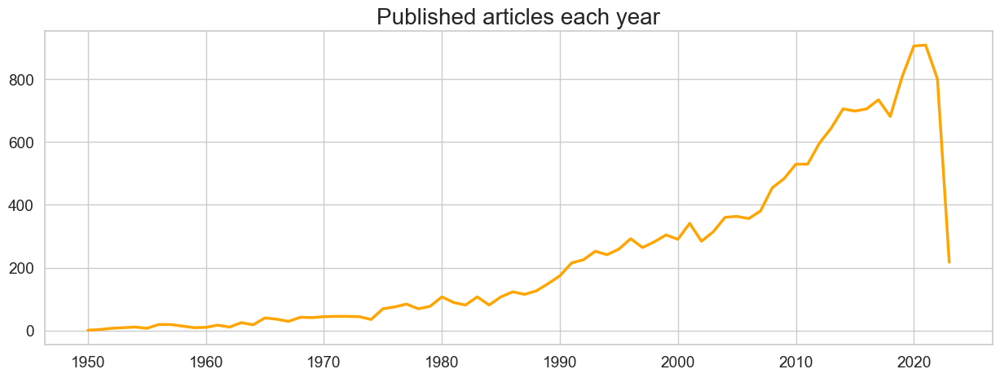

In [235]:
plt.figure(figsize=(15,5))
plt.plot([int(years['PublicationYear'][i]) for i in range(len(years))],
         years['pubmed_id'], color = 'orange')
plt.title('Published articles each year', size = 20)
plt.show()

## States

In [52]:
stati=pd.DataFrame(dati.groupby(['Journal Country'],as_index=False).count())
stati.head()

,Journal Country,pubmed_id,Title,Abstract,ArticleDate,CompletedDate,RevisedDate,PublicationYear,Language,AuthorList,PublicationTypeList,PreprocessedAbstract
0,Algeria,7,7,0,0,7,7,7,7,7,7,0
1,Argentina,12,12,9,0,12,12,12,12,12,12,9
2,Australia,82,82,72,21,81,82,82,82,82,82,72
3,Austria,24,24,21,11,18,24,24,24,24,24,21
4,Bangladesh,5,5,5,1,4,5,5,5,5,5,5


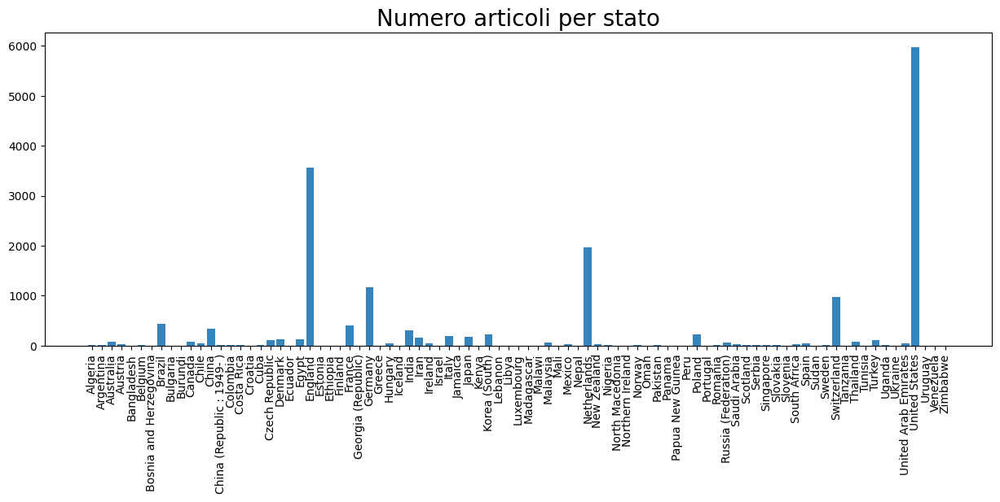

In [78]:
x_lab = stati['Journal Country']
y_val = stati['pubmed_id']
x_range = np.arange(len(x_lab))
plt.figure(figsize=(15,5))
plt.bar(x_range, y_val, align='center', alpha=0.9, )
plt.xticks(x_range, x_lab, rotation='vertical')
plt.title('Numero articoli per stato', size = 20)
plt.show()

In [116]:
top10 = stati.sort_values(by=['pubmed_id'], ascending=False).head(10)

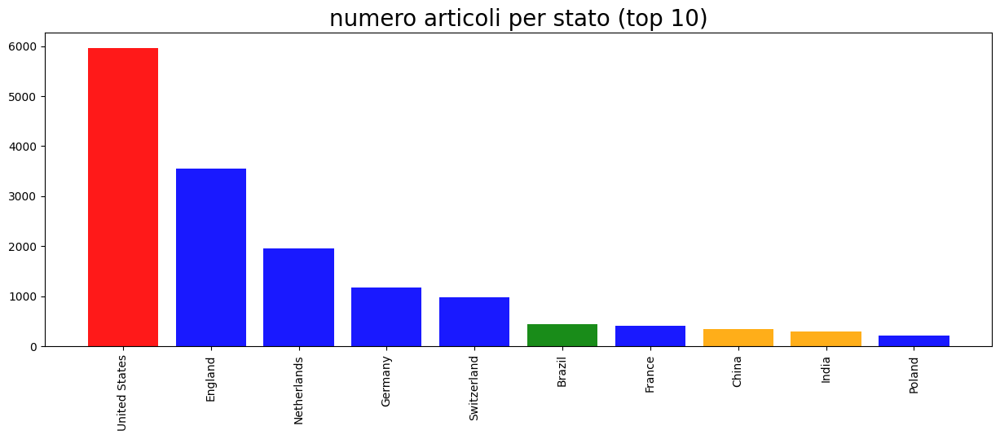

In [121]:
import pycountry_convert as pc

def country_to_continent(country_name):
    if country_name == 'England':
        return 'Europe'
    country_alpha2 = pc.country_name_to_country_alpha2(country_name)
    country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
    country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
    return country_continent_name

top10['continent'] = top10['Journal Country'].apply(country_to_continent)
top10[['continent', 'Journal Country']].head(10)

def color_fun (state):
    if (country_to_continent(state) == 'Europe'):
        return 'blue'
    elif (country_to_continent(state) == 'Asia'):
        return 'orange'
    elif (country_to_continent(state) == 'Africa'):
        return 'brown'
    elif (country_to_continent(state) == 'North America'):
        return 'red'
    elif (country_to_continent(state) == 'South America'):
        return 'green'
    elif (country_to_continent(state) == 'Oceania'):
        return 'purple'
    
x_lab = top10['Journal Country']
y_val = top10['pubmed_id']
x_range = np.arange(len(x_lab))
plt.figure(figsize=(15,5))
plt.bar(x_range, y_val, align='center', alpha=0.9, color = [color_fun(x) for x in x_lab])
plt.xticks(x_range, x_lab, rotation='vertical')
plt.title('numero articoli per stato (top 10)', size = 20)
plt.show()

# TOPIC MODELLING

In questa sezione utlizzeremo la variabile 'PreprocessedAbstract', quindi è necessario togliere le righe con valori mancanti

In [250]:
data2=data[data['PreprocessedAbstract'].notna()]

Aggiungo altre stopwords (eventualmente altre ancora)

In [252]:
stop_words = set(['gondii','toxoplasma', 'toxoplasmosis'])

In [ ]:
for ndoc in data2.index:                    
    data2['PreprocessedAbstract'][ndoc]=[w for w in data2['PreprocessedAbstract'][ndoc] if not w in stop_words]

PreprocessedAbstract2 è nel formato giusto per usare la funzione "10_most_common_words" (ed è ad un join di distanza per essere usato nella funzione "wordcloud")

In [254]:
def join_tokens(list):
    return ' '.join(list)

data2['PreprocessedAbstract2'] = data2['PreprocessedAbstract'].apply(lambda x: join_tokens(x))

## WORDCLOUD

In [241]:
# Import the wordcloud library
from wordcloud import WordCloud

In [242]:
# Join the different processed titles together.
long_string = ' '.join(list(data2['PreprocessedAbstract2'].values))
long_string

'soluble atp diphosphohydrolase apyrase ec purified potato tuber solanum tuberosum specific activity mumol mg min cdna corresponding potato apyrase isolated termed rrop deduced amino acid sequence contains putative signal sequence two hydrophobic region carboxy terminus two potential asn linked glycosylation site four region amino terminal half term acr apyrase conserved region highly conserved known apyrases related enzyme garden pea nucleoside triphosphatase nucleoside triphosphate hydrolases saccharomyces cerevisiae golgi guanosine diphosphatase yeast kda hypothetical protein chromosome caenorhabditis elegans hypothetical kda protein chromosome iii human cd lymphoid cell activation antigen also share conserved acr region ability hydrolyze nucleotide assessed observation experimental aspergillosis chorioallantoic membrane confirmed strontium uptake aspergillus lesion directly due infection fungus uptake found normal infected control membrane avidity radionuclide uptake proportional m

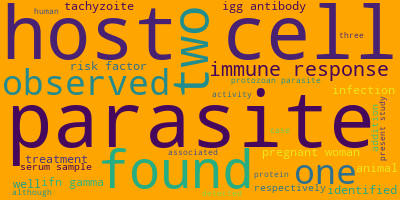

In [270]:
# Create a WordCloud object
wordcloud = WordCloud(background_color="orange", max_words=30, contour_width=3,
                      contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

# Non inserendo il parametro 'stopwords' all'interno della funzione WordCloud, oltre alle stop words
# tolte nel preprocessing (e nella cella precedente) vengono tolte le stopwords standard inglesi

## 10 most common words

In [266]:
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

def plot_10_most_common_words(count_data, count_vectorizer):
    words = count_vectorizer.get_feature_names_out()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts+=t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:10]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words))
    
    
    plt.figure(2, figsize=(15, 15/1.6180))
    plt.subplot(title='10 most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x = x_pos, y = counts, color='orange')
    plt.xticks(x_pos, words, rotation=90) 
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.show()

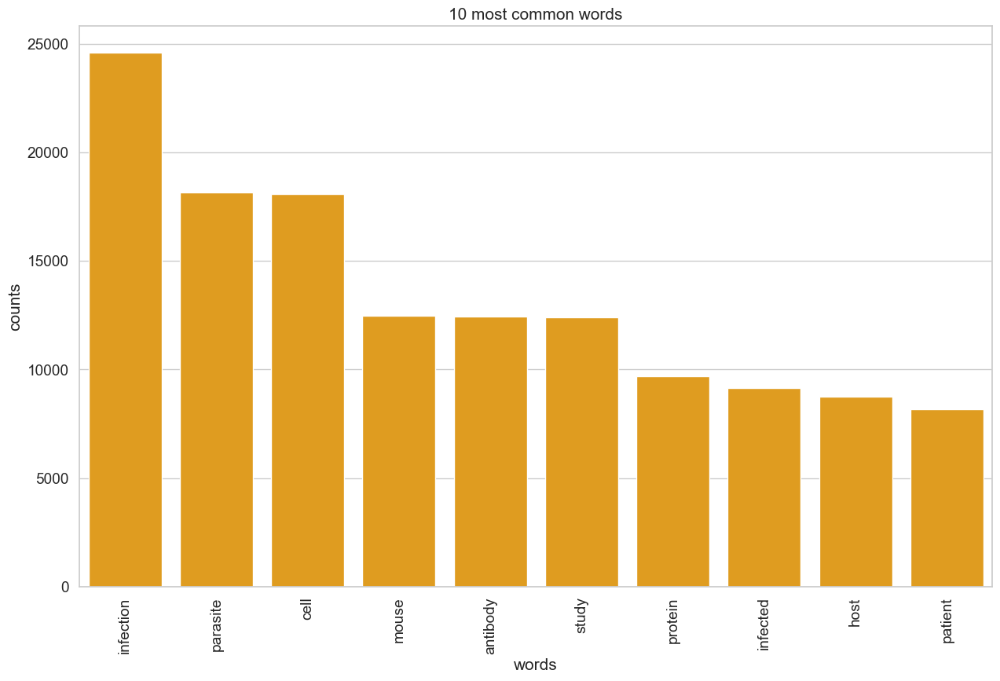

In [267]:
# Initialise the count vectorizer with the English stop words
count_vectorizer = CountVectorizer()
# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(data2['PreprocessedAbstract2'])
# Visualise the 10 most common words
plot_10_most_common_words(count_data, count_vectorizer)

Forse c'è ancora della lemmatization da fare (vedi barplot) e delle stop words da togliere (vedi wordcloud)